In [1]:
import os
import torch
from torch import nn
from torch.nn import functional as F
from torch import optim
from torch.utils.data import DataLoader, sampler
from torchvision import transforms as T
from torchvision import models

from PIL import Image

from matplotlib import pyplot as plt
%matplotlib inline

from datetime import datetime

from usns_v3_utils import *
from usns_v3_models import *

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
DATA_PATH = 'data/'
TRAIN_PATH = os.path.join(DATA_PATH, 'train')
TEST_PATH = os.path.join(DATA_PATH, 'test')
MODEL_PATH = 'models/'
SUBMS_PATH = 'submissions/'


if torch.cuda.is_available():
    device = torch.device('cuda')
    dtype = torch.cuda.FloatTensor
else:
    device = torch.device('cpu')
    dtype = torch.FloatTensor

In [4]:
model_input_size = (256, 256)
img_mean = (0.38983212684516944,)
img_std = (0.21706658034222048,)

transform = T.Compose([
    Resize(model_input_size),
    RandomVerticalFlip(0.5),
    RandomHorizontalFlip(0.5),
    ToTensor(),
    Normalize(mean=img_mean, std=img_std)
])

transform_val = T.Compose([
    Resize(model_input_size),
    ToTensor(),
    Normalize(mean=img_mean, std=img_std)
])

Splitting dataset to train and validation sets

In [5]:
# NB!: there are only 47 patients in trainig dataset.
params_split = {
    'test_size': 0.1,
    'random_state': 42
}

# Full trainig dataset
imglist_full_train, imglist_full_val = train_val_split(TRAIN_PATH, **params_split)

# List of labeled images from dataset
imglist_labeled = get_labeled(TRAIN_PATH)

imglist_labeled_train = list(set(imglist_full_train) & set(imglist_labeled))
imglist_labeled_val = list(set(imglist_full_val) & set(imglist_labeled))

In [6]:
# auxiliary function creating dataset with given images and transform
def trainset(imglist, transform):
    """Returns trainig USNSDataset containing images from imglist
        imglist: list of images (without masks) to include in returned dataset
        transform: transforms to apply
    """
    return USNSDataset(TRAIN_PATH, imglist, train=True, transform=transform)

In [7]:
params = {'batch_size': 8}

# Data loaders
loader_full_train = DataLoader(
    trainset(imglist_full_train, transform),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)
loader_full_val = DataLoader(
    trainset(imglist_full_val, transform_val),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

# Labled data loaders
loader_labeled_train = DataLoader(
    trainset(imglist_labeled_train, transform),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)
loader_labeled_val = DataLoader(
    trainset(imglist_labeled_val, transform_val),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

In [8]:
params_unet = {
    'n_filters': 16,
    'bn': True
}

unet = Unet5(**params_unet)
unet = unet.to(device=device);

detector = USNSDetector(unet, device)

1000 images processed, loss = 0.5392407720088959
Validation loss = 0.46594422025752186
Val Dice score = 0.022279880940914154

2000 images processed, loss = 0.408137589931488
Validation loss = 0.3777610726766475
Val Dice score = 0.5418533682823181

3000 images processed, loss = 0.3510490756034851
Validation loss = 0.327046886260601
Val Dice score = 0.5981878638267517

4000 images processed, loss = 0.3046244068145752
Validation loss = 0.28270193227941487
Val Dice score = 0.6595264673233032

5000 images processed, loss = 0.2631950417757034
Validation loss = 0.24759673383180208
Val Dice score = 0.6802466511726379

After 1 epochs: loss = 0.0017545335912060604
Validation loss = 0.24551244863683672
Val Dice score = 0.6784301996231079


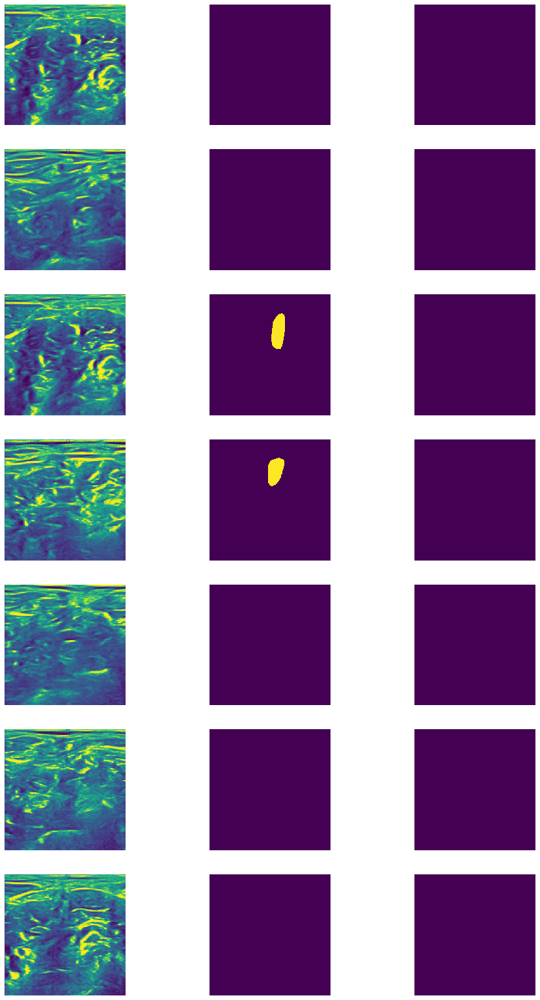


6004 images processed, loss = 0.22851193461760108
Validation loss = 0.24252121735096774
Val Dice score = 0.12929244339466095

7004 images processed, loss = 0.20153463923931123
Validation loss = 0.17284935172989294
Val Dice score = 0.6768869161605835

8004 images processed, loss = 0.17534837293624878
Validation loss = 0.1634683224414545
Val Dice score = 0.4750286042690277

9004 images processed, loss = 0.15391519021987915
Validation loss = 0.13887392404879473
Val Dice score = 0.6695309281349182

10004 images processed, loss = 0.13755091547966003
Validation loss = 0.13049703858830097
Val Dice score = 0.6928213238716125

After 2 epochs: loss = 0.0008476673728232349
Validation loss = 0.11833214481207285
Val Dice score = 0.6811351776123047


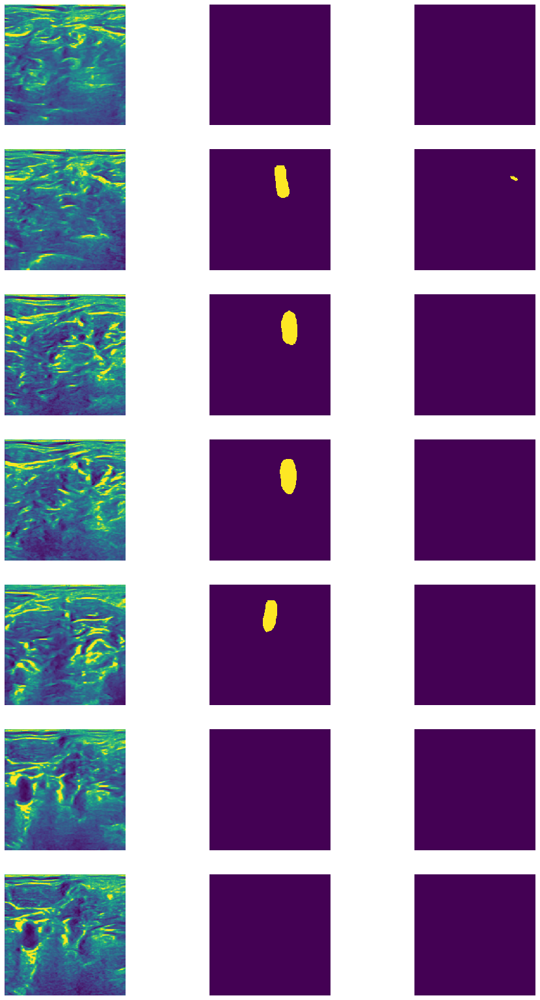


11000 images processed, loss = 0.12108163960487488
Validation loss = 0.10612544393748394
Val Dice score = 0.6944907903671265

12000 images processed, loss = 0.10689877045154572
Validation loss = 0.09245175649357558
Val Dice score = 0.6928213238716125

13000 images processed, loss = 0.0968779485821724
Validation loss = 0.09154135595777
Val Dice score = 0.6911519169807434

14000 images processed, loss = 0.08667972469329834
Validation loss = 0.07682999089136347
Val Dice score = 0.7028394341468811

15000 images processed, loss = 0.08002614831924439
Validation loss = 0.07029157510036618
Val Dice score = 0.7028394341468811

After 3 epochs: loss = 0.0005170375716285413
Validation loss = 0.06826074984863724
Val Dice score = 0.7028380632400513


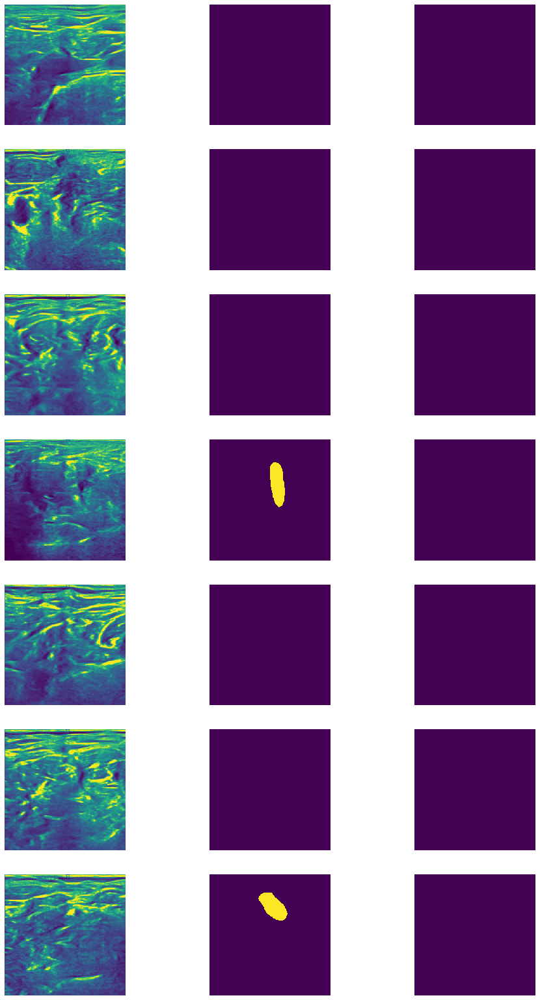


16004 images processed, loss = 0.07222367941858283
Validation loss = 0.062344660998037545
Val Dice score = 0.6651009917259216

17004 images processed, loss = 0.06710854643583297
Validation loss = 0.056555754229899044
Val Dice score = 0.6501859426498413

18004 images processed, loss = 0.062488695979118346
Validation loss = 0.05407067203586408
Val Dice score = 0.5611124038696289

19004 images processed, loss = 0.05811796250939369
Validation loss = 0.05031632154383922
Val Dice score = 0.6984459757804871

20004 images processed, loss = 0.053788953840732574
Validation loss = 0.04591415065009526
Val Dice score = 0.660438060760498

After 4 epochs: loss = 0.000357449650202269
Validation loss = 0.045031753544367614
Val Dice score = 0.6541359424591064


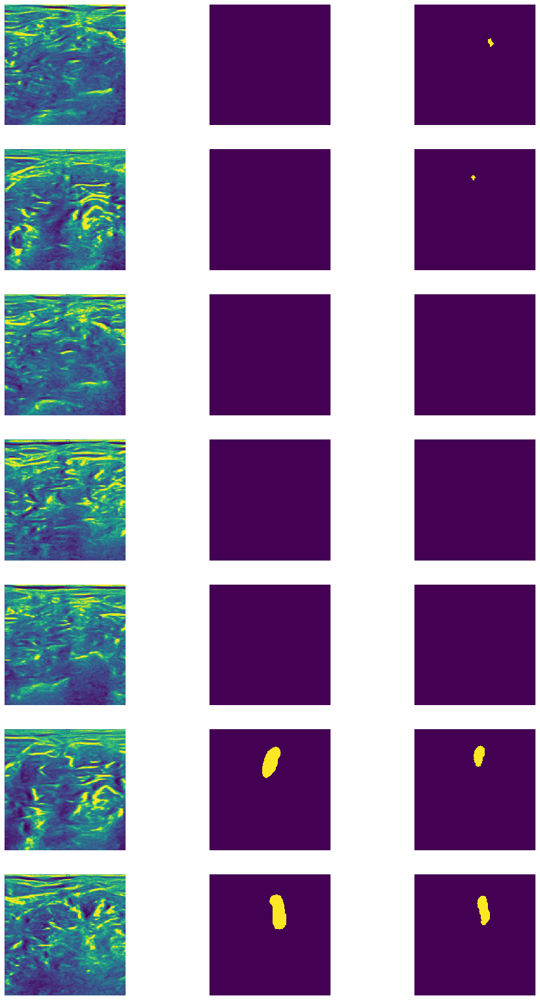


21000 images processed, loss = 0.05111907792079401
Validation loss = 0.045343778952831815
Val Dice score = 0.5162167549133301

22000 images processed, loss = 0.04810216230154037
Validation loss = 0.04156795142215361
Val Dice score = 0.60212641954422

23000 images processed, loss = 0.04519416734576225
Validation loss = 0.04074983703647313
Val Dice score = 0.5750508308410645

24000 images processed, loss = 0.04416962584853172
Validation loss = 0.035229738388142126
Val Dice score = 0.6994277238845825

25000 images processed, loss = 0.04108624689280987
Validation loss = 0.035065163116597374
Val Dice score = 0.7328336834907532

After 5 epochs: loss = 0.0002910062658871991
Validation loss = 0.03664442180393136
Val Dice score = 0.5472069978713989


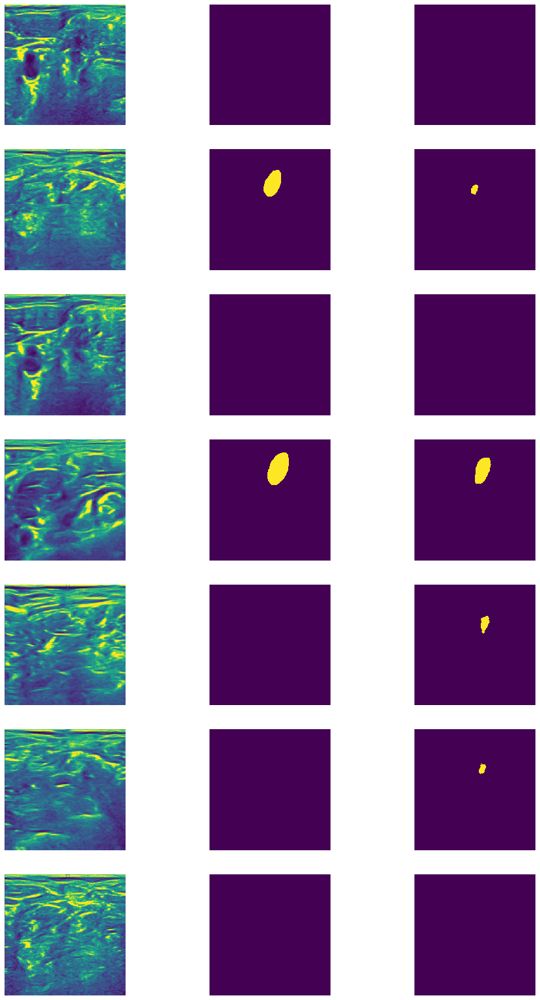


26004 images processed, loss = 0.03906545991382276
Validation loss = 0.033345264079475245
Val Dice score = 0.6654821634292603

27004 images processed, loss = 0.03701012295484543
Validation loss = 0.03166963563973896
Val Dice score = 0.7212232947349548

28004 images processed, loss = 0.038523949682712555
Validation loss = 0.03051123778663812
Val Dice score = 0.6519442796707153

29004 images processed, loss = 0.035791746497154234
Validation loss = 0.027891026110153566
Val Dice score = 0.6948449611663818

30004 images processed, loss = 0.03447742235660553
Validation loss = 0.027492015139014774
Val Dice score = 0.6583803296089172

After 6 epochs: loss = 0.00023769564987775475
Validation loss = 0.02911723004918365
Val Dice score = 0.613800048828125


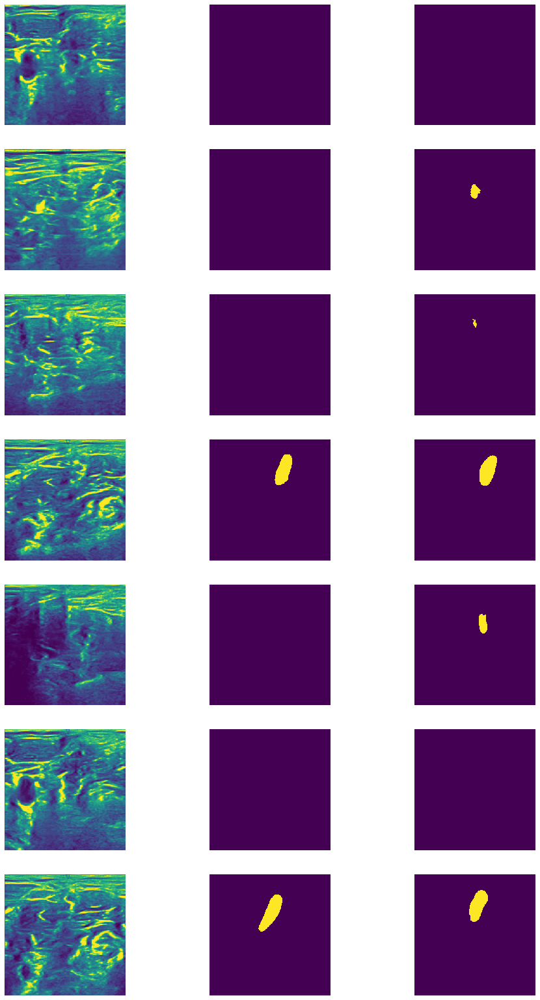


31000 images processed, loss = 0.03326294037053384
Validation loss = 0.03191299715354566
Val Dice score = 0.5517576932907104

32000 images processed, loss = 0.03186251729726791
Validation loss = 0.028710565758318655
Val Dice score = 0.6091601848602295

33000 images processed, loss = 0.03135065771639347
Validation loss = 0.027060883859785053
Val Dice score = 0.665153980255127

34000 images processed, loss = 0.029919907778501512
Validation loss = 0.024283575206584543
Val Dice score = 0.7090902328491211

35000 images processed, loss = 0.030632822528481485
Validation loss = 0.025181351552945944
Val Dice score = 0.6797190308570862

After 7 epochs: loss = 0.00021642977877999898
Validation loss = 0.024058285798995643
Val Dice score = 0.7408018112182617


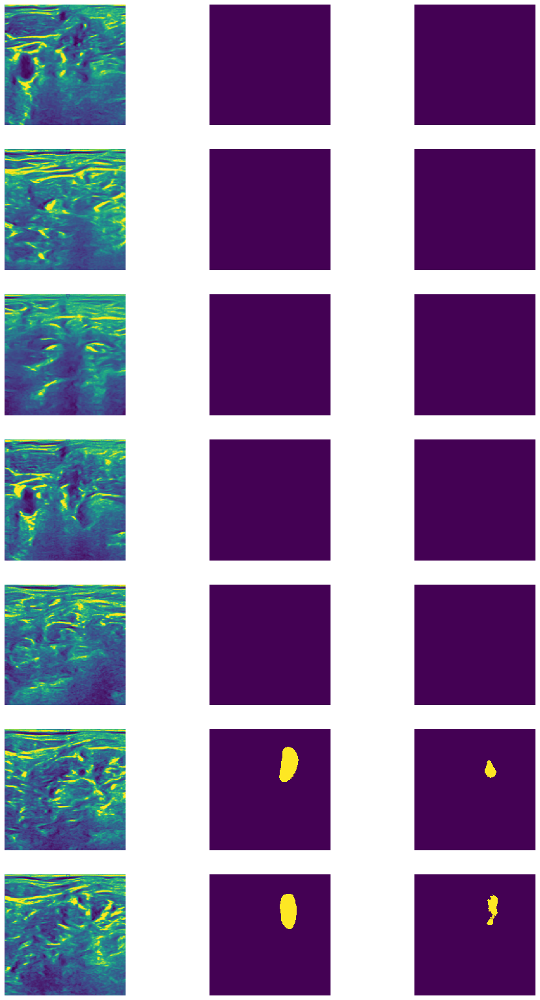


36004 images processed, loss = 0.029412856177089223
Validation loss = 0.026853056518805644
Val Dice score = 0.5715242624282837

37004 images processed, loss = 0.028748748026788236
Validation loss = 0.022811708800830506
Val Dice score = 0.6808642148971558

38004 images processed, loss = 0.028324682526290418
Validation loss = 0.02235253890183364
Val Dice score = 0.6596185564994812

39004 images processed, loss = 0.028921853214502333
Validation loss = 0.02417220085710038
Val Dice score = 0.7354947328567505

40004 images processed, loss = 0.02690964926034212
Validation loss = 0.022778807991559
Val Dice score = 0.6902746558189392

After 8 epochs: loss = 0.0001721858313992158
Validation loss = 0.0211896064748773
Val Dice score = 0.7328551411628723


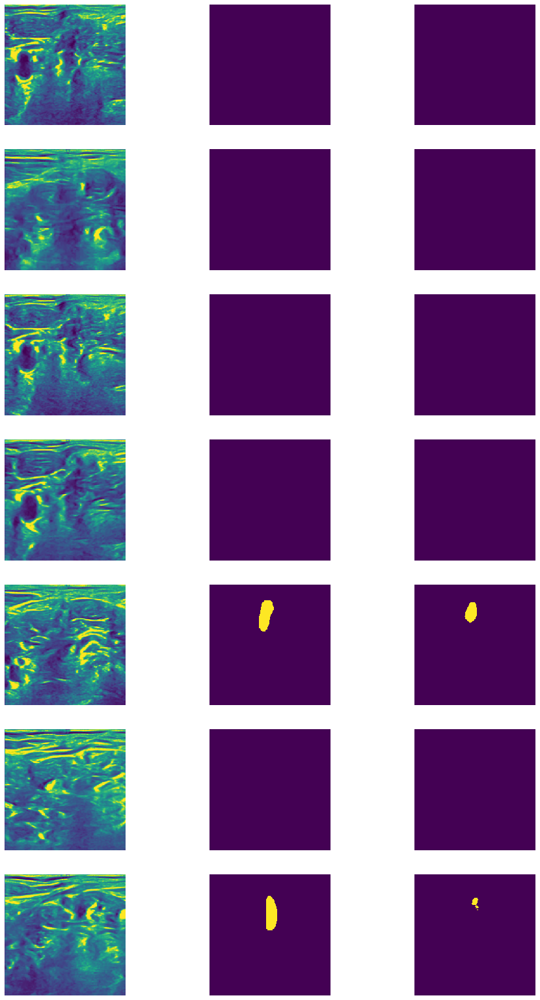


41000 images processed, loss = 0.02592013865320319
Validation loss = 0.021912317186631326
Val Dice score = 0.7386763095855713

42000 images processed, loss = 0.026952276609838007
Validation loss = 0.022063673584285085
Val Dice score = 0.6721773147583008

43000 images processed, loss = 0.025432352110743524
Validation loss = 0.021477152420851544
Val Dice score = 0.721092164516449

44000 images processed, loss = 0.02660907742381096
Validation loss = 0.020976909388086832
Val Dice score = 0.6939539313316345

45000 images processed, loss = 0.02551081205904484
Validation loss = 0.02226879334198513
Val Dice score = 0.6950806975364685

After 9 epochs: loss = 0.0001845739311058222
Validation loss = 0.021011782749454942
Val Dice score = 0.6926018595695496


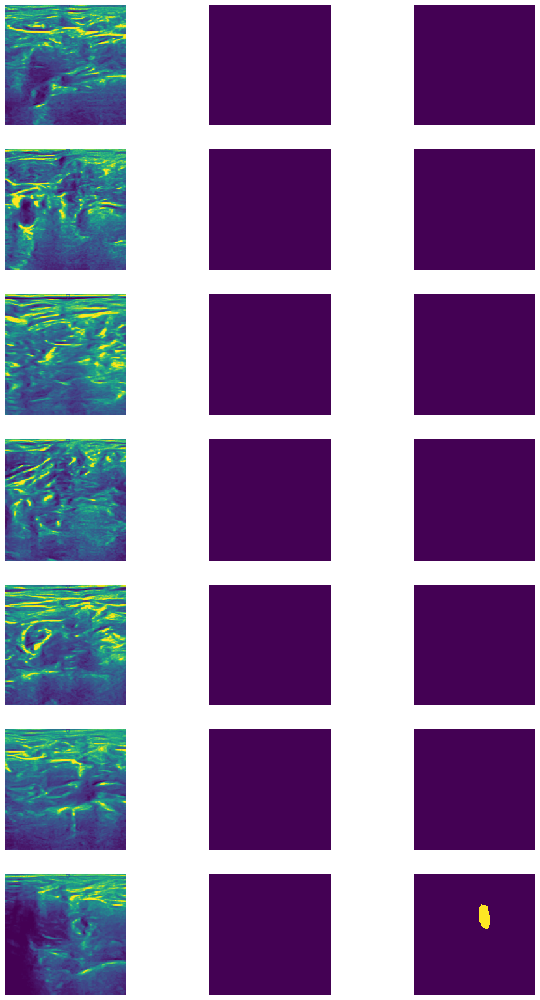


46004 images processed, loss = 0.025289823126745412
Validation loss = 0.020830778184289328
Val Dice score = 0.6604084372520447

47004 images processed, loss = 0.02462330614030361
Validation loss = 0.0218418000455641
Val Dice score = 0.7181400060653687

48004 images processed, loss = 0.025252693071961402
Validation loss = 0.020167995751127973
Val Dice score = 0.7109267115592957

49004 images processed, loss = 0.024222558975219726
Validation loss = 0.021755247801318392
Val Dice score = 0.6620199680328369

50004 images processed, loss = 0.023769631542265416
Validation loss = 0.02207957070712653
Val Dice score = 0.5795513987541199

After 10 epochs: loss = 0.00017194487775858667
Validation loss = 0.021275517746855897
Val Dice score = 0.7348079681396484


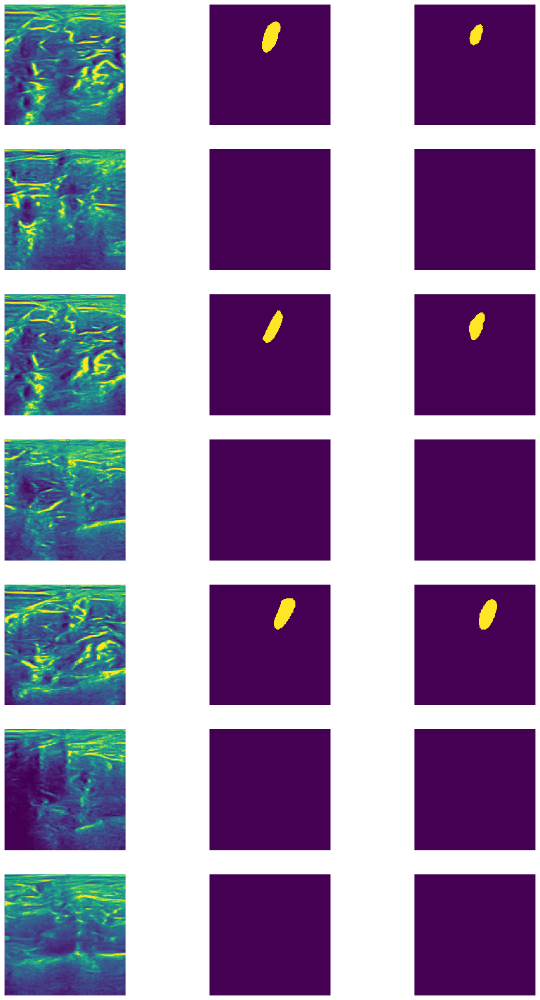


51000 images processed, loss = 0.025339644821173693
Validation loss = 0.021017065685310827
Val Dice score = 0.7343655824661255

52000 images processed, loss = 0.022491132080554962
Validation loss = 0.01977050108508594
Val Dice score = 0.7252568602561951

53000 images processed, loss = 0.023480141498148442
Validation loss = 0.019387009176573343
Val Dice score = 0.694778323173523

54000 images processed, loss = 0.022975845389068127
Validation loss = 0.01879705019133517
Val Dice score = 0.7194285988807678

55000 images processed, loss = 0.02415495502948761
Validation loss = 0.018677124762923172
Val Dice score = 0.718900740146637

After 11 epochs: loss = 0.00017862164704788807
Validation loss = 0.01949886982958882
Val Dice score = 0.6405852437019348


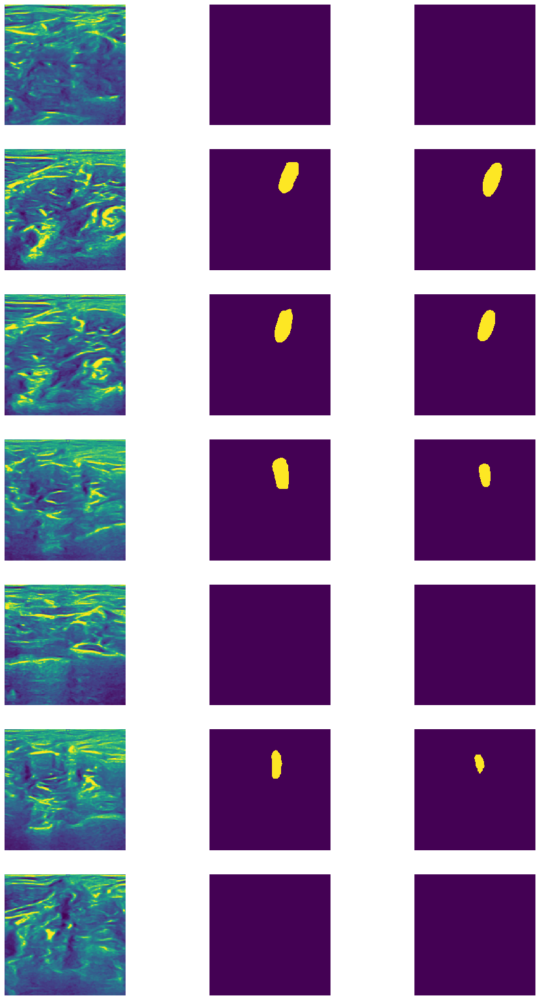


56004 images processed, loss = 0.023036422319265
Validation loss = 0.01899584156394204
Val Dice score = 0.7321281433105469

57004 images processed, loss = 0.023477888025343417
Validation loss = 0.021836450018722545
Val Dice score = 0.5878070592880249

58004 images processed, loss = 0.022775291092693807
Validation loss = 0.019361987940108835
Val Dice score = 0.729543149471283

59004 images processed, loss = 0.02302281504869461
Validation loss = 0.01890370353608577
Val Dice score = 0.7390944361686707

60004 images processed, loss = 0.023125461854040623
Validation loss = 0.01871007780710823
Val Dice score = 0.7155181765556335

After 12 epochs: loss = 0.00015076193507284377
Validation loss = 0.01873190527881351
Val Dice score = 0.7214204668998718


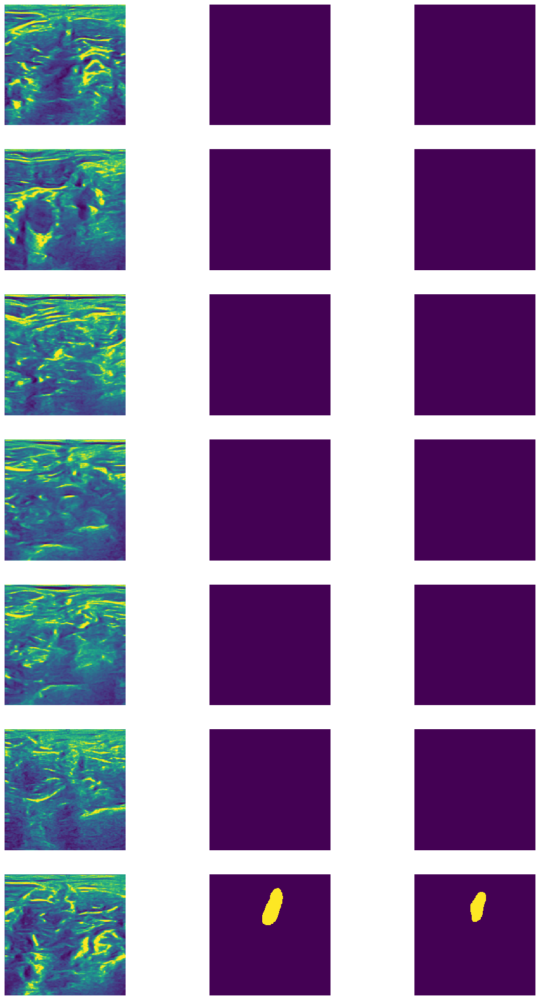


61000 images processed, loss = 0.02162604522423811
Validation loss = 0.01823971885410394
Val Dice score = 0.7070712447166443

62000 images processed, loss = 0.02084968651458621
Validation loss = 0.018506539242345223
Val Dice score = 0.7490677237510681

63000 images processed, loss = 0.02279210539907217
Validation loss = 0.01897354679919145
Val Dice score = 0.7042744755744934

64000 images processed, loss = 0.022314389064908027
Validation loss = 0.021241315234707472
Val Dice score = 0.6066325306892395

65000 images processed, loss = 0.022806024476885796
Validation loss = 0.017921659419117168
Val Dice score = 0.7086424231529236

After 13 epochs: loss = 0.00015324220138006702
Validation loss = 0.018407561220788397
Val Dice score = 0.7116499543190002


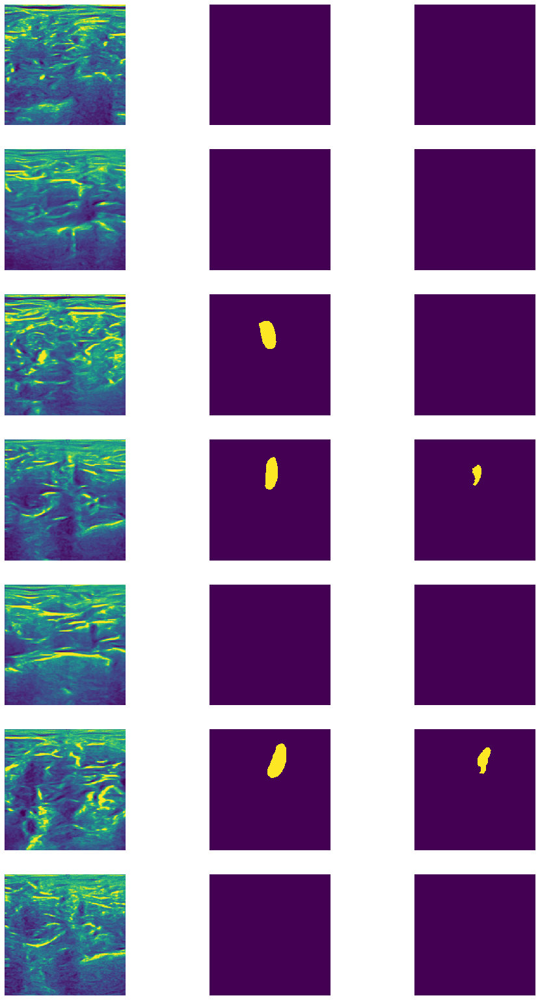


66004 images processed, loss = 0.021423489155908266
Validation loss = 0.018169699529052178
Val Dice score = 0.7178341150283813

67004 images processed, loss = 0.02262910585850477
Validation loss = 0.019235241197310824
Val Dice score = 0.7112804055213928

68004 images processed, loss = 0.020326862372457982
Validation loss = 0.01861865526509902
Val Dice score = 0.6976008415222168

69004 images processed, loss = 0.02110634619742632
Validation loss = 0.018943157698492672
Val Dice score = 0.714431643486023

70004 images processed, loss = 0.022101127162575722
Validation loss = 0.017466597877853304
Val Dice score = 0.7187162041664124

After 14 epochs: loss = 0.0001524673822603999
Validation loss = 0.019282985854900143
Val Dice score = 0.6708967685699463


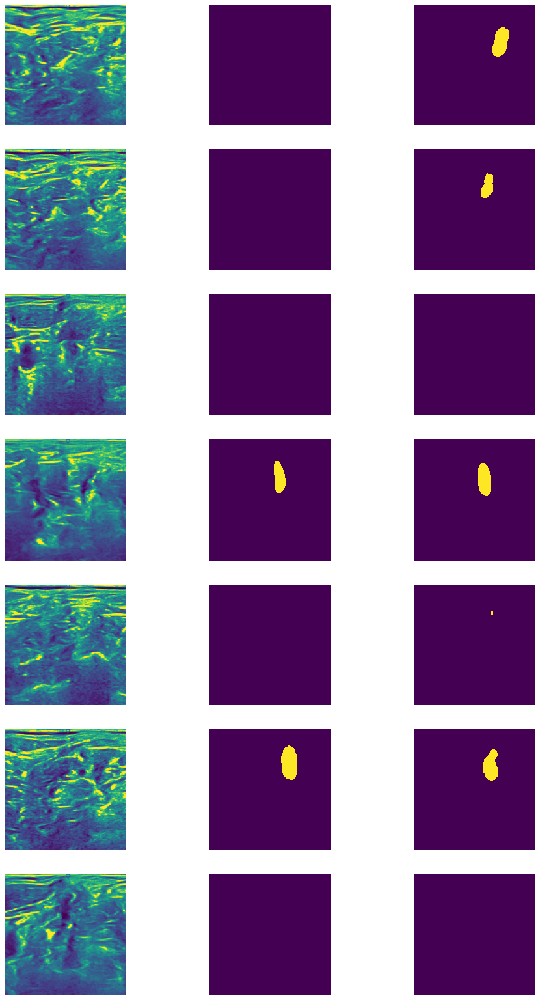


71000 images processed, loss = 0.021625141040926957
Validation loss = 0.018185550256792412
Val Dice score = 0.7433703541755676

72000 images processed, loss = 0.0209936786852777
Validation loss = 0.02222294143038819
Val Dice score = 0.5900576710700989

73000 images processed, loss = 0.02110196926817298
Validation loss = 0.018131655160468288
Val Dice score = 0.724962592124939

74000 images processed, loss = 0.021259014442563055
Validation loss = 0.02001023153775995
Val Dice score = 0.6905567646026611

75000 images processed, loss = 0.021215286269783973
Validation loss = 0.017884603549161916
Val Dice score = 0.7323483824729919

After 15 epochs: loss = 0.00014116073001115955
Validation loss = 0.018545751066533275
Val Dice score = 0.7309466600418091


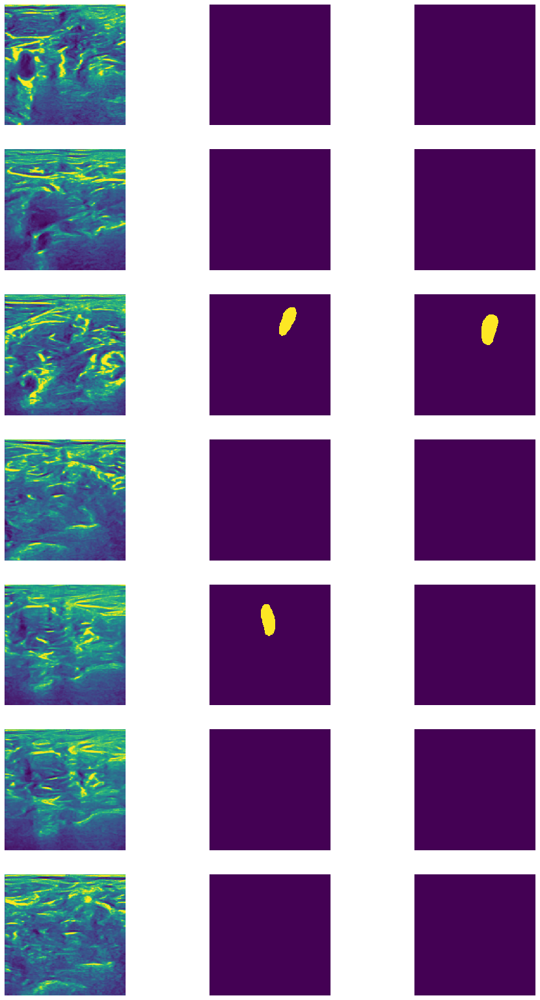


76004 images processed, loss = 0.019851079303400212
Validation loss = 0.018714348696955853
Val Dice score = 0.7230340838432312

77004 images processed, loss = 0.02010234101489186
Validation loss = 0.019040999209542504
Val Dice score = 0.6917420029640198

78004 images processed, loss = 0.020094763360917568
Validation loss = 0.017724043371712475
Val Dice score = 0.7403405904769897

79004 images processed, loss = 0.021207548819482325
Validation loss = 0.020291338921936606
Val Dice score = 0.6402922868728638

80004 images processed, loss = 0.022078530184924602
Validation loss = 0.018246045479168478
Val Dice score = 0.7319682836532593

After 16 epochs: loss = 0.00015944468548759593
Validation loss = 0.017821492952215353
Val Dice score = 0.733754575252533


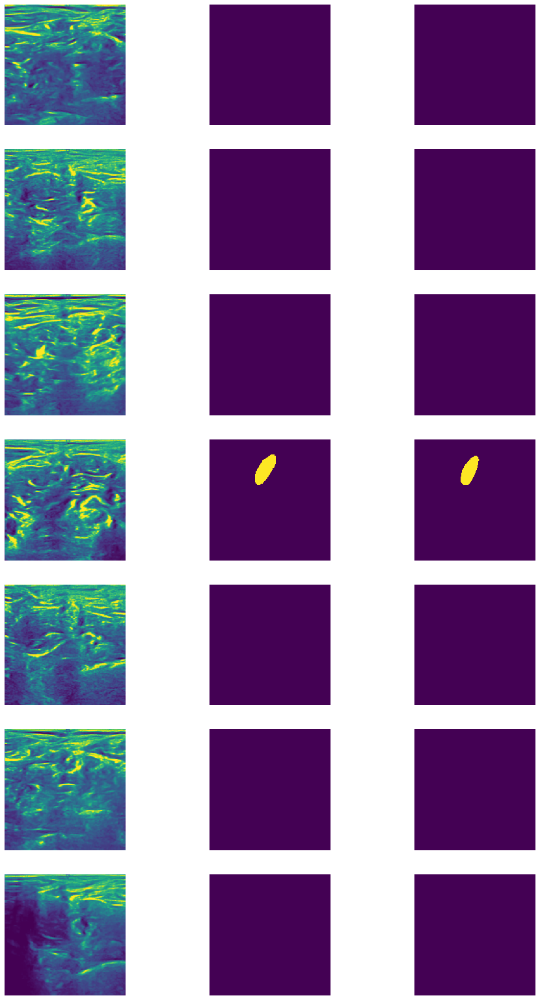


81000 images processed, loss = 0.021213578064009607
Validation loss = 0.018254167743910334
Val Dice score = 0.7206715941429138

82000 images processed, loss = 0.020651358366012573
Validation loss = 0.020588085422283024
Val Dice score = 0.6347060203552246

83000 images processed, loss = 0.021372485339641572
Validation loss = 0.017674567583693387
Val Dice score = 0.7409034371376038

84000 images processed, loss = 0.020208754800260065
Validation loss = 0.019482091193605146
Val Dice score = 0.7232617139816284

85000 images processed, loss = 0.01953992399945855
Validation loss = 0.01917720859394547
Val Dice score = 0.6935234069824219

After 17 epochs: loss = 0.00014078815087389902
Validation loss = 0.019796486685864118
Val Dice score = 0.7363327145576477


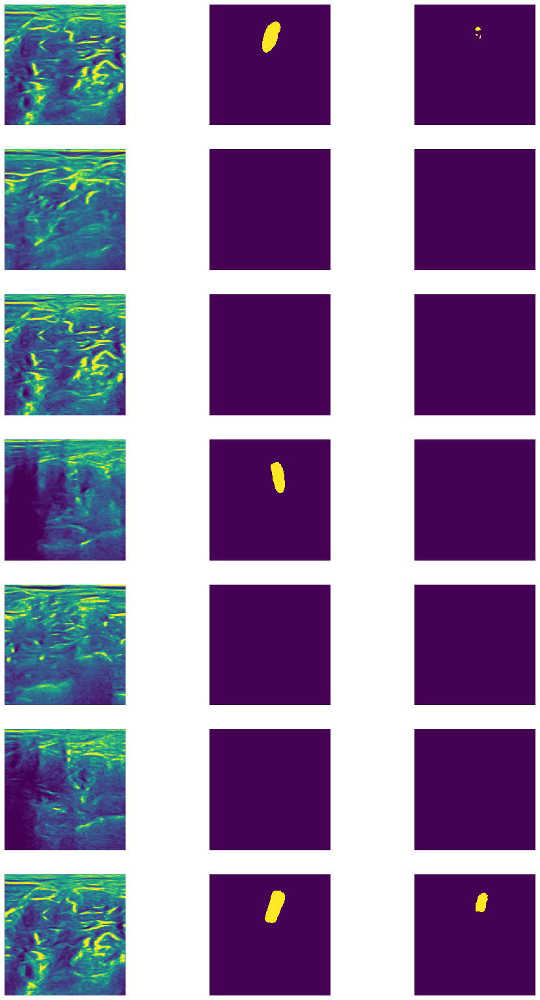


86004 images processed, loss = 0.019539826300989584
Validation loss = 0.018289555946305918
Val Dice score = 0.7213248610496521

87004 images processed, loss = 0.021139648057520388
Validation loss = 0.018402601547153646
Val Dice score = 0.7126191854476929

88004 images processed, loss = 0.0194729550331831
Validation loss = 0.01873330623751043
Val Dice score = 0.6587663888931274

89004 images processed, loss = 0.020192531492561103
Validation loss = 0.01907844230290098
Val Dice score = 0.6871168613433838

90004 images processed, loss = 0.019882645711302757
Validation loss = 0.01819053805667988
Val Dice score = 0.7284659147262573

After 18 epochs: loss = 0.00014059918594559192
Validation loss = 0.01862238499045198
Val Dice score = 0.69234299659729


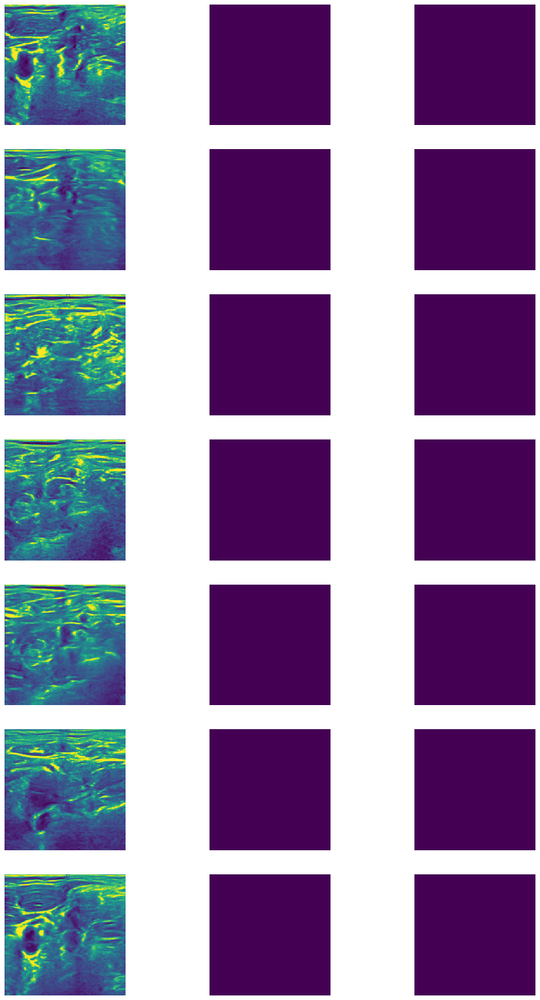


91000 images processed, loss = 0.019999468848707687
Validation loss = 0.018360817938645017
Val Dice score = 0.6723454594612122

92000 images processed, loss = 0.018058612633496524
Validation loss = 0.017768404012754285
Val Dice score = 0.7338918447494507

93000 images processed, loss = 0.020840307768434287
Validation loss = 0.01787753496163576
Val Dice score = 0.7219196557998657

94000 images processed, loss = 0.01902724704146385
Validation loss = 0.017909346378481447
Val Dice score = 0.7376293540000916

95000 images processed, loss = 0.02086929006502032
Validation loss = 0.018628351234104827
Val Dice score = 0.6849221587181091

After 19 epochs: loss = 0.00014355962011419776
Validation loss = 0.019018733525689138
Val Dice score = 0.6759039759635925


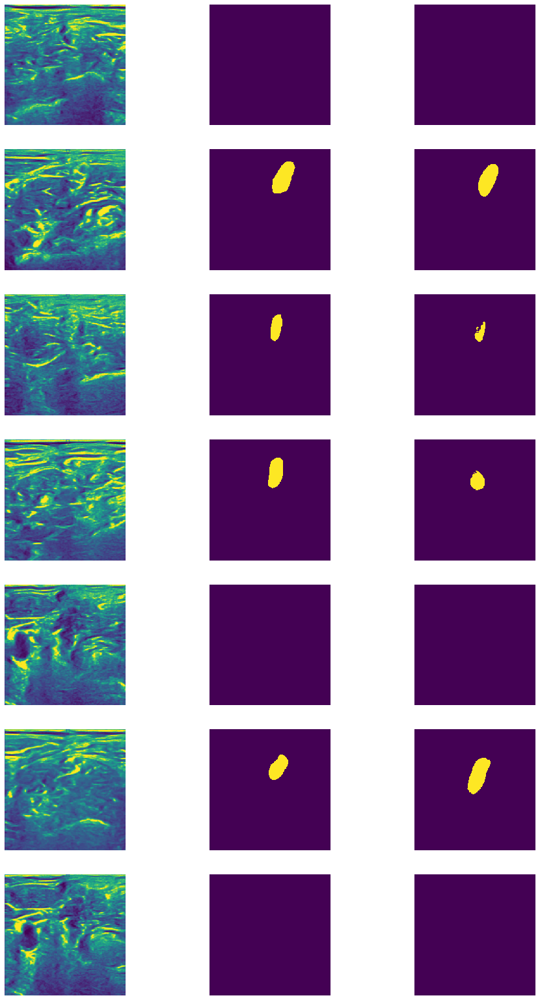


96004 images processed, loss = 0.02023064969218822
Validation loss = 0.019092379148757218
Val Dice score = 0.653058648109436

97004 images processed, loss = 0.01929481165483594
Validation loss = 0.017280254363764905
Val Dice score = 0.7338465452194214

98004 images processed, loss = 0.01936719097569585
Validation loss = 0.01809204625391801
Val Dice score = 0.7278510928153992

99004 images processed, loss = 0.01974618062376976
Validation loss = 0.018754651307443995
Val Dice score = 0.673317551612854

100004 images processed, loss = 0.020011997383087874
Validation loss = 0.017749256126346293
Val Dice score = 0.748475193977356

After 20 epochs: loss = 0.0001321890118448293
Validation loss = 0.02224513614093123
Val Dice score = 0.6127375364303589


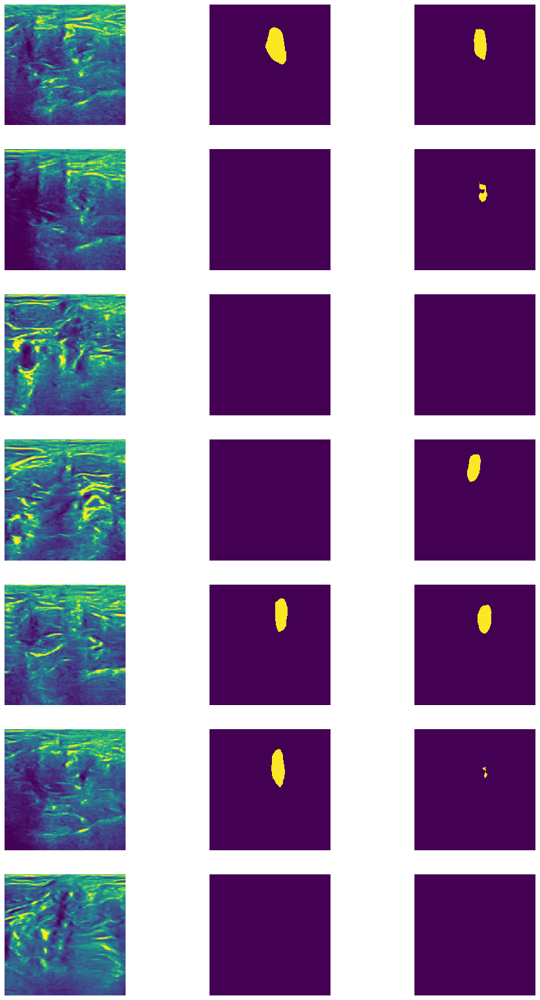


Best model dice: 0.7490677237510681
CPU times: user 14min 47s, sys: 2min 19s, total: 17min 6s
Wall time: 16min 25s


In [9]:
%%time

params_train = {
    'epochs': 20,
    'print_every': 1000,
    'lr': 0.0001
}

detector.fit(loader_full_train, loader_full_val, **params_train)

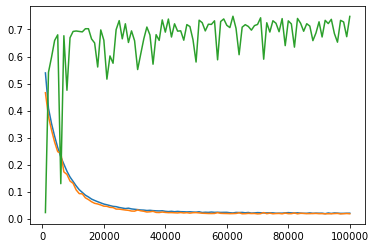

In [10]:
plt.plot(detector.n_samples, detector.loss_history,
         detector.n_samples, detector.val_loss_history,
         detector.n_samples, detector.dice_history);

In [15]:
detector.best_model_dice

tensor(0.7807, device='cuda:0')

In [13]:
detector.model.load_state_dict(detector.best_model_wts)

<All keys matched successfully>

In [9]:
torch.save(detector.model.state_dict(),
           os.path.join(MODEL_PATH, 'unet_v3_filters64_epochs20.pth'))

In [10]:
torch.save(detector.best_model_wts,
           os.path.join(MODEL_PATH, 'unet_v3_best_filters64_epochs20.pth'))

In [8]:
detector.model.load_state_dict(torch.load(os.path.join(MODEL_PATH, 'unet_v3_filters64_epochs20.pth')))

<All keys matched successfully>

## Binary classifier

### Old code

In [9]:
out_left = None
out_last = None

def leftout_hook(m, i, o):
    global out_left
    out_left = o

def lastout_hook(m, i, o):
    global out_last
    out_last = o

In [10]:
detector.model.dn_blk4.register_forward_hook(leftout_hook)
detector.model.up_blk4.register_forward_hook(lastout_hook)

In [27]:
x, y = iter(loader_val_full).next()
x = x.to(device)
y = y.to(device)

In [28]:
detector.model.eval()
with torch.no_grad():
    out_model = detector.model(x)

In [29]:
print(out_left.shape)
print(out_last.shape)

torch.Size([2, 512, 52, 72])
torch.Size([2, 64, 416, 576])


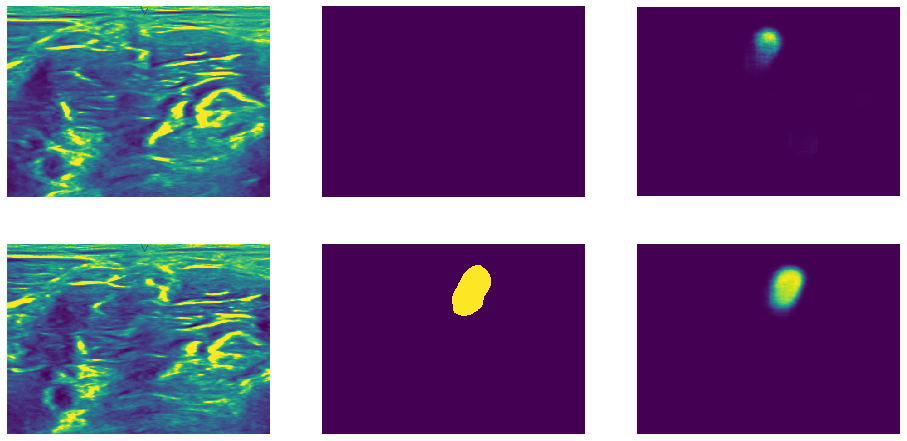

In [31]:
show_imgs(x.cpu(),
          y.cpu(),
          (out_model.detach().cpu()[:, 1, :, :] - out_model.detach().cpu()[:, 0, :, :]).sigmoid().unsqueeze(1))

### New draft code

In [53]:
feat_gen_model = Unet5Part(**params_unet)
model_bin = BinClf(8*8*16*params_unet['n_filters'])

In [54]:
## load pretrained weights
feat_gen_model.load_state_dict(detector.best_model_wts, strict=False)

# Fix feature extracter parameters. We use it just as feature extractor
for param in feat_gen_model.parameters():
    param.require_grad = False

feat_gen_model.to(device)
feat_gen_model.eval()
model_bin.to(device)

BinClf(
  (fc): Linear(in_features=16384, out_features=1, bias=True)
)

In [55]:
def train(model, optimizer, dataloader_train, dataloader_val, epochs=1):
    loss_train_history = []
    loss_val_history = []
    
    loss_accum = 0
    num_images = 0
    for ee in range(epochs):
        for x, y in dataloader_train:
            model.train()
            x = x.to(device)
            target = y.flatten(start_dim=1).max(dim=1)[0]
            target = target.to(device)
            
            scores = model(feat_gen_model(x))
            scores.squeeze_()
            loss = F.binary_cross_entropy_with_logits(scores, target, reduction='sum')
            
            loss_accum += loss.item()
            num_images += x.shape[0]
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        loss_train_history.append(loss_accum / num_images)
        loss_accum = 0
        num_images = 0
            
        print(f'After {ee+1} epochs: loss = {loss_train_history[-1]}')
        ## validation
        for x, y in dataloader_val:
            model.eval()
            x = x.to(device)
            target = y.flatten(start_dim=1).max(dim=1)[0]
            target = target.to(device)
            
            scores = model(feat_gen_model(x))
            scores.squeeze_()
            loss = F.binary_cross_entropy_with_logits(scores, target, reduction='sum')
            
            loss_accum += loss.item()
            num_images += x.shape[0]
        
        loss_val_history.append(loss_accum / num_images)
        loss_accum = 0
        num_images = 0
        print(f'Validation loss = {loss_val_history[-1]}')
        
    plt.plot(range(epochs), loss_train_history,
             range(epochs), loss_val_history )
        

After 1 epochs: loss = 0.45623368210646725
Validation loss = 0.469381731519715
After 2 epochs: loss = 0.45506739464896934
Validation loss = 0.5394579655738028
After 3 epochs: loss = 0.4575800708449957
Validation loss = 0.5949115761134381
After 4 epochs: loss = 0.4529748595984707
Validation loss = 0.5483487528035159
After 5 epochs: loss = 0.45012296474671154
Validation loss = 0.5235023391067684
After 6 epochs: loss = 0.44617686800013656
Validation loss = 0.5296551377227987
After 7 epochs: loss = 0.4428090828990917
Validation loss = 0.5382944235519097
After 8 epochs: loss = 0.4438798366391157
Validation loss = 0.6174765915822903
After 9 epochs: loss = 0.43756798270725844
Validation loss = 0.5744874572913118
After 10 epochs: loss = 0.4384538777604569
Validation loss = 0.5768363509631913
After 11 epochs: loss = 0.42745020437609876
Validation loss = 0.529773746985625
After 12 epochs: loss = 0.42159863898117833
Validation loss = 0.5996678540225021
After 13 epochs: loss = 0.43160243480332416


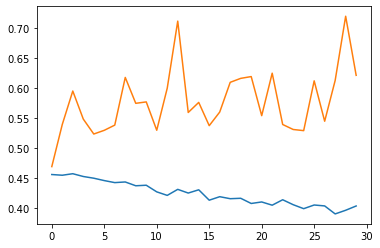

In [57]:
optimizer = optim.Adam(model_bin.parameters(), lr=0.0001)
train(model_bin, optimizer, loader_full_train, loader_full_val, epochs=30)

## Submission

In [17]:
testset = USNSDataset(TEST_PATH, train=False, transform=transform_val)
loader_test = DataLoader(
    testset,
    batch_size=params['batch_size'],
    num_workers=6,
    pin_memory=True
)

In [18]:
%%time
fname = datetime.now().strftime('%Y%m%d_%H%M%S') + '.csv'
subms_path = os.path.join(SUBMS_PATH, fname)
detector.generate_submission(loader_test, subms_path)

CPU times: user 49.9 s, sys: 984 ms, total: 50.9 s
Wall time: 23.8 s


## Draft

In [36]:
x, y = iter(loader_labeled_val).next()

In [188]:
snap = TF.normalize(x[0], (-img_mean[0]/img_std[0],), (1/img_std[0],))[0]
targ = y[0, 0]
pred = y[5, 0]

In [189]:
snap = TF.to_pil_image(snap, mode='L')
targ = TF.to_pil_image(targ, mode='L')
pred = TF.to_pil_image(pred, mode='L')

In [190]:
zero = Image.new('L', (256, 256))

In [191]:
mask = Image.merge('RGB', (zero, targ, pred))

In [192]:
snap = snap.convert("RGB")

In [193]:
alpha = Image.composite(pred, targ, pred)

In [194]:
snap.paste(mask, None, alpha.point(lambda x: x//255*200))

In [51]:
imlist = compose_visualization(x, y, y1)

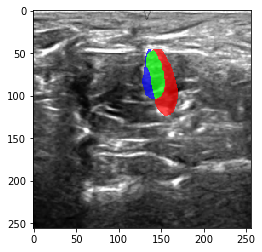

In [52]:
plt.imshow(imlist[7])